# Generate, Propagate, and Edit Fish Segmentation Masks

This notebook is meant for creating segmentation masks of the fish from the fishway videos. The mask for a single frame is generated by providing click prompts to the Segment Anything Model (SAM2). This mask is then forward and backward propagated through the video to create a complete masked track of the fish, or multiple fishes, through the video. Then the masks can be edited using a drawing tool to add missing parts of the fish to the mask or to remove any background that was incorporated into the mask. The masks are saved to a json file in COCO label format.

## Load Libraries

The code in this section loads the required libraries and the functions from the labelling_functions.py file. Set which GPU device you will use in the first cell. You can check if any of the GPUs are in use by running `nvidia-smi` in your terminal. 

In [1]:
import sys
import os

# Add the directory of the .py file to the path (only needed once at top)
os.chdir("/home/simone/LO_Fishway_Labelling")
sys.path.append("/home/simone/LO_Fishway_Labelling")
os.getcwd()

# Set which GPU to use (Simone = 0, Bushra = 1)
#os.environ["CUDA_VISIBLE_DEVICES"] = "0"

'/home/simone/LO_Fishway_Labelling'

In [2]:
import importlib
import numpy as np
import torch
import json
from tqdm import tqdm
from pathlib import Path
import labelling_functions
from matplotlib import pyplot as plt
from IPython.display import Video

In [6]:
## Run this cell to reload functions from labelling_functions.py after editing --------------
importlib.reload(labelling_functions)
import labelling_functions

In [3]:
print(sys.executable)

/usr/local/Python/3.13.3/bin/python3


## Part 1: Generate Masks (Uses GPU)

### Select a Video to Label

The cell below will select a random video from the fishway dataset to be labelled. If you would like to select a specific video to label or draw a video from a specific directory then you can input the video or directory path as the `specific_path` variable in the cell below.

In [86]:
base_video_dir = Path("/data/remora") #path to where all the fishway videos are stored
labelled_data_dir = Path("/data/labeled/simone") #path to where the labelled data is stored

# change the video_path to the path of the video in the spreadsheet
video_path = Path("/data/remora/Credit/2023/09252034-09292023/23  09  25  13  21/1313.mp4")

When run, the cell below will output the video that was chosen above. Watch the video to see if you want to label it (more details below). Make note of whether the fish leaves the camera view and reappears as this will be important when propagating the masks.

In [87]:
# Play selected video
Video(str(video_path), embed=True)

* If you watched the video above it is too hard to make out the fishes due to turbid water or low lighting then this is probably not a video we want to label as it will be too difficult. In this case, write a little note that explains why this video shouldn't be lablled by anyone, for example, "Dark" or "Turbid" or "Blocked camera" in the speadsheet under comments. Go back to the first cell in this section to select a new video. Do not run the cell below.

* If you watched the video and decided you do want to label the video, then enter 0.5 into the mask annoted column and your name into the labeller column. This will indicate to others that the labelling of this video is in progress. Then run the cell below, this will create a new directory which is named after the file path of the video. Inside this folder there are two folders: `images` which contains the frames extracted from the video as jpeg images, and `annotations` which contains a json file called `instances_default.json` which will be used to store the masks that will be created later in this notebook.

Here are some examples of videos that are too difficult to label. Notice how it is difficult to make out the outline of the fish due to low contrast between the fish and the backgound or the cloudliness of the water.

<p float="left">
  <img src="demo_images/low_contrast_chinook.png" width="500"/>
  <img src="demo_images/turbid_rainbow_trout.png" width="500"/>
</p>


In [4]:
# No need to change the code below this line, it will create the folder structure and extract frames from the video
new_folder_path = labelling_functions.create_labelled_video_dir(label_dir=labelled_data_dir, video_path=video_path, base_dir=base_video_dir)
images_path = new_folder_path / "images"
labelling_functions.extract_frames_opencv(video_path, images_path)
annotations_path = Path(new_folder_path / "annotations")
annotations_path.mkdir(parents=True, exist_ok=True)
json_path = annotations_path / "instances_default.json"
coco = labelling_functions.create_coco_json(images_path, json_path)

Created folder: /data/labeled/simone/Ganaraska__Ganaraska 2024__08012024-08082024__24  08  01  08  53__56
Extracted 162 frames to: /data/labeled/simone/Ganaraska__Ganaraska 2024__08012024-08082024__24  08  01  08  53__56/images
COCO JSON saved to: /data/labeled/simone/Ganaraska__Ganaraska 2024__08012024-08082024__24  08  01  08  53__56/annotations/instances_default.json


### Set Up Segment Anything Model (SAM2)

The code in this section sets up the model for running inference on the chosen video. The jpeg frames are added to the inference state and this inference state is used and continuously updated when generating or propagating masks. You do not need to edit any of the cells in this section, just run them all as is.

In [5]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )
elif device.type == "cpu":
    torch.autocast("cpu", dtype=torch.bfloat16).__enter__()

#torch.set_float32_matmul_precision('high')

using device: cuda


In [6]:
from sam2.build_sam import build_sam2_video_predictor

sam2_checkpoint = "/home/simone/checkpoints/sam2.1_hiera_large.pt" # Change this to the path of your SAM2 checkpoint (see README for details)
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint, device=device)

In [7]:
# Load the video and initialize the predictor... create inference state
inference_state = predictor.init_state(video_path=str(images_path))

frame loading (JPEG): 100%|██████████| 162/162 [00:02<00:00, 61.30it/s]


### Generate and Propagate Masks

If you ever want to reset the inference state and the json file that stores the labels so that you can start over labelling the video then uncomment the last two lines of the cell below and run it.

In [ ]:
## Reset the inference state and coco JSON (only needed if you make a mistake when annotating and want to start over)
#predictor.reset_state(inference_state)
#coco = labelling_functions.create_coco_json(images_path, json_path)

The cell below will output a widget that allows you to create and propagate masks of fish throughout the video. See the labelling instructions PDF for guidelines about how the masks should look. Here is the recommended workflow with information about how to work with multiple fish in the next paragraph:


1. Find a frame of the video where all of the fish is clearly visible, particularily any fins that may not show up well on parts of the background. If this isn't possible then go with what you think is the best frame.

2. Select the `Species` from the dropdown menu and ensure the `Track ID` is set to 1 (each fish in a video has a unique track ID).

3. Click on the fish and its fins to add positive clicks which indicate where the fish is. Right click in areas around the fish to add negative clicks that indicate areas where the fish is not, particularily in areas that may be mistaken to be part of the fish (i.e. between two fins, in areas where contrast is low around fish boundary). You can left/right click on a positive/negative click that you've added to remove it. 

4. Click the `Generate Mask` button to create the mask based on the clicks you just added. The mask will be overlayed on the frame of the fish. You can click the `Show Clicks` button to stop displaying the clicks if you would like to see the mask more clearly.

5. If you are not happy with some areas of the mask, you can add more positive and negative clicks in these areas and regenerate the mask. The previous clicks you added will still be used to generate the mask. If you would like to go back to a previous mask you generated you can click `Undo Mask`.

8. Once you are happy with the mask, you can click the `Propagate Mask` button. This will automatically propagate the mask forward through to the end of the video and should output a progress tracker above the plot so you can see if it is working. If you do not want to propagate to the end of the video you can enter the last frame index number that you want to propagate into the `Target Frame` text box.

8. Once the forward propagation is complete, you can flip to the next few frames to see if the propagation worked okay. Then flip back to the frame that you first created the mask on. Enter 0 or the earliest frame number that you want to propagate to into the `Target Frame` text box and then click the `Propagate Mask` button to propagate the mask backward through the video.

9. Once the backward propagation is complete and you have confirmed that it worked okay by looking at a few previous frames then you can click the `Save JSON` button. This will add the annotations to the coco json that was created at the beginning of the notebook.


Here are some notes about working with videos that have multiple fish and other edge cases:


* When adding clicks, make sure you have selected the correct species for the fish you are clicking on and make sure that each fish is assigned its own `Track ID`.

* If you can find a frame that has clear visibility of all the fish, then you can generate masks for all the fish at once after providing clicks. Then, you can propagate the masks in the same way described above.

* If you cannot find a frame that has clear visibility of all the fish, then you can track each fish individially. That is, you do all the steps above, ignoring the other fish.

* The `Undo Button` will only undo the mask of the spcies and `Track ID` that is currently selected in the UI, not all the masks for the current frame.

* The `Delete Annotation` button should be used when you have created an annotation for a fish that is the wrong species or is not there at all. When tracking multiple fish, sometimes the track can switch to another fish when one of the fish leaves the frame. Make sure to delete any annotations that should not be there.

* If you make a mistake when annotating, for example you assign the wrong species, or generate a mask on the background, it is best to reset the inference state so that the clicks and masks are removed from the model. You can do this by running the cell that is commented out just above this paragraph. This will also reset the coco json file and coco object so that all annotation will be removed. 

* If a fish completely leaves the view of the camera and then reenters the view, then only assign the fish the same `Track ID` if:
    * You are confident it is the same fish (based on species, size, angle of reentry, movement pattern).
    * The fish reenters in roughly the same location it left by.
    * There is not more than 1 other fish in the video. 
    * The fish is not out of view for more than 3 seconds (you can check the time stamp for each frame at the top of the video).


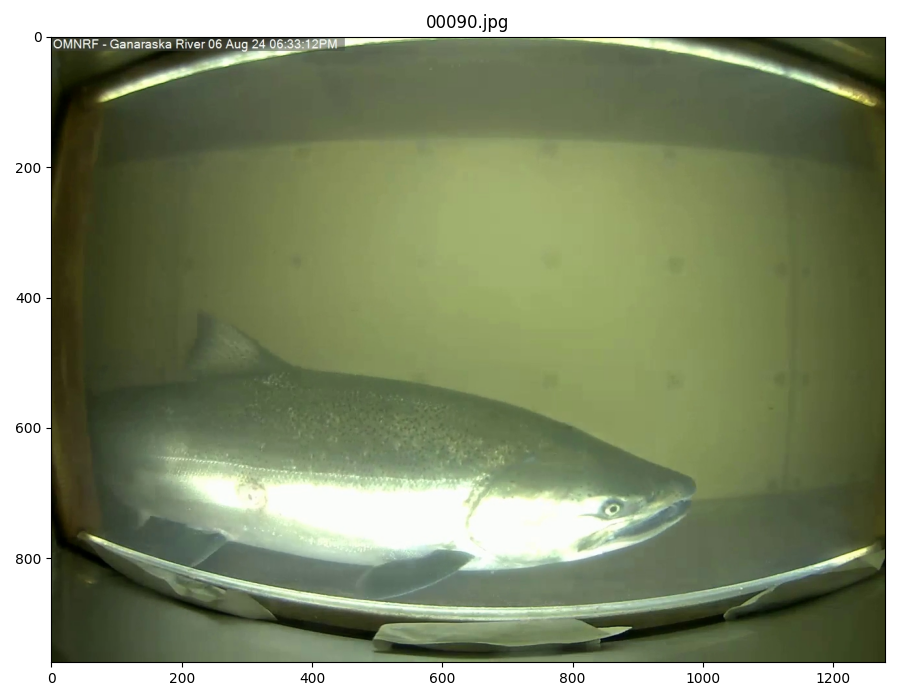

In [9]:
# This cell displays the ImageAnnotationWidget for annotating the video frames
# The only thing you need to change is the start_frame parameter if you want to jump around the video quickly to decide where to start
%matplotlib widget
importlib.reload(labelling_functions)
from labelling_functions import ImageAnnotationWidget

# Clean up any existing widget to save memory
if 'widget1' in locals():
    plt.close(widget1.fig)
    del widget1

plt.close('all')

# Initialize widget
widget1 = ImageAnnotationWidget(
    coco_dict=coco,
    image_dir=images_path,
    start_frame=90,
    predictor=predictor,
    inference_state=inference_state,
    output_json_path=json_path,
)
display(widget1.ui)

Once you are done generating the masks for the video make sure you click the Save JSON button.

Now that you have finished generating the masks you need to **RESTART THE KERNEL FOR THE NOTEBOOK**! This will clear the previous video and the SAM model state from the GPU memory. This is very important for preventing overloading the memory.

## Part 2: Edit Masks (No GPU)

In [3]:
import sys
import os

# Add the directory of the .py file to the path (only needed once at top)
os.chdir("/home/simone/LO_Fishway_Labelling")
sys.path.append("/home/simone/LO_Fishway_Labelling")

from matplotlib import pyplot as plt
from labelling_functions import MaskEditor

This section is for editing the masks that you have generated in part 1. This section is independent of Part 1 so you do not have to run the code from Part 1 before running this section, but you must run the Load Libraries section first. At the end of this section there are some images that can help guide you on how the masks should look.

In [4]:
# Select which video to edit the masks for by inputting the video folder
images_dir, edited_annotations_path = labelling_functions.select_video_to_edit(video_folder = "/data/labeled/simone/Credit__2024__08012024-08122024__24  08  01  11  58__29")

Now that you have selected a video to edit, you can now use the widget below to edit the masks. You can draw in or erase areas of the mask. You can choose whether to draw using the lasso tool or the polygon tool. Try out both to see which you prefer. The Smooth Mask button will get rid of small floating points and interior holes withing the mask. The undo button will undo the last edit you made to the displayed frame, whether that is drawing, erasing, or smoothing the mask. To zoom in to the image, click the Zoom In button and then click on the area of the plot you want to zoom into. If there are multiple fish in the frame, you can choose which mask you want to edit using the dropdown menu. The Save JSON button will save the edited masks to the COCO JSON file that was created above. Make sure to click the Save JSON button once in a while as you are editing so you do not loose all the edits you made if the widget crashes or something. You can click the Show Mask button if you would like to see the image without the mask overlayed. When generating the widget, you also have the option to change the transparancy of the mask if you like.

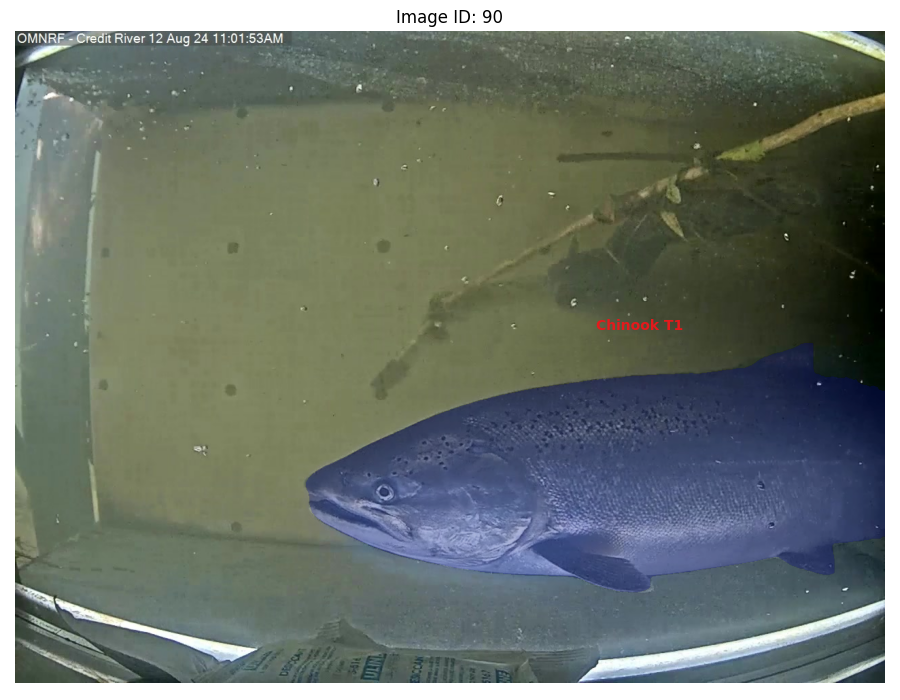

In [5]:
%matplotlib widget
importlib.reload(labelling_functions)
from labelling_functions import MaskEditor

# Clean up any existing widget to save memory
if 'widget2' in locals():
    plt.close(widget2.fig)
    del widget2

plt.close('all')

widget2 = MaskEditor(coco_json_path=edited_annotations_path, 
                     frames_dir=images_dir, 
                     start_frame=90,
                     mask_transparancy=0.3)

Once you are done editing the masks for the video make sure you click the Save JSON button, then you can update the spreadsheet with a 1 in the mask annotated column to indicate the masks are complete. 

Here are some examples for when and when not to add missing parts of the fish to the mask. The image on the left shows a fish for which the mask is missing the lower fins. You can still make out the fins and their outline so you can add them to the mask using the drawing tool to end up with the image on the right.

<p float="left">
  <img src="demo_images/missing_fins.png" width="500"/>
  <img src="demo_images/add_fins.png" width="500"/>
</p>

Here is an example of a zoomed in image of a fish where it is too difficult to make out where the missing areas of the fish are. You cannot confidently draw in the rest of the mask and you to not want to halluciate something that is not there so we just leave it as is. In cases like this, sometimes it can help to flip forward and back through a few frames to see if this helps with the context. If it is still too hard to tell then do not draw in the missing areas.

<p float="center">
  <img src="demo_images/fin_not_visible.png" width="500"/>
</p>

In [ ]:
# Example usage:
# importlib.reload(labelling_functions)

# labelling_functions.create_video_with_masks(
#     frames_dir="/home/simone/shared-data/labeled/simone/Ganaraska__Ganaraska 2024__09162024-09232024__24  09  16  16  14__564/images",
#     coco_json_path="/home/simone/shared-data/labeled/simone/Ganaraska__Ganaraska 2024__09162024-09232024__24  09  16  16  14__564/annotations/instances_default.json",
#     output_video_path="output_with_masks.mp4",
#     fps=10
# )

✅ Video saved to output_with_masks.mp4
